<a href="https://colab.research.google.com/github/AKSHAY3842/identification-of-fake-images/blob/main/trial1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
np.random.seed(2)
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [ ]:
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential



In [ ]:
from keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator

In [ ]:
#from keras.callbacks import EarlyS
from keras.callbacks import EarlyStopping

In [ ]:
from PIL import Image, ImageChops, ImageEnhance
import os
import itertools

In [ ]:
def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpg'
    ela_filename = 'temp_ela.png'

    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = Image.open(temp_filename)

    ela_image = ImageChops.difference(image, temp_image)

    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1
    scale = 255.0 / max_diff

    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)

    return ela_image

In [ ]:
import tensorflow as tf
class Config:
    CASIA1 = "../input/casia-dataset/CASIA1"
    CASIA2 = "../input/casia-dataset/CASIA2"
    autotune = tf.data.experimental.AUTOTUNE
    epochs = 30
    batch_size = 32
    lr = 1e-3
    name = 'xception'
    n_labels = 2
    image_size = (224, 224)
    decay = 1e-6
    momentum = 0.95
    nesterov = False

In [ ]:
def compute_ela_cv(path, quality):
    temp_filename = 'temp_file_name.jpg'
    SCALE = 15
    orig_img = cv2.imread(path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

    cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

    # read compressed image
    compressed_img = cv2.imread(temp_filename)

    # get absolute difference between img1 and img2 and multiply by scale
    diff = SCALE * cv2.absdiff(orig_img, compressed_img)
    return diff

In [ ]:
def random_sample(path, extension=None):
    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')

    items = list(items)

    p = random.choice(items)
    return p.as_posix()

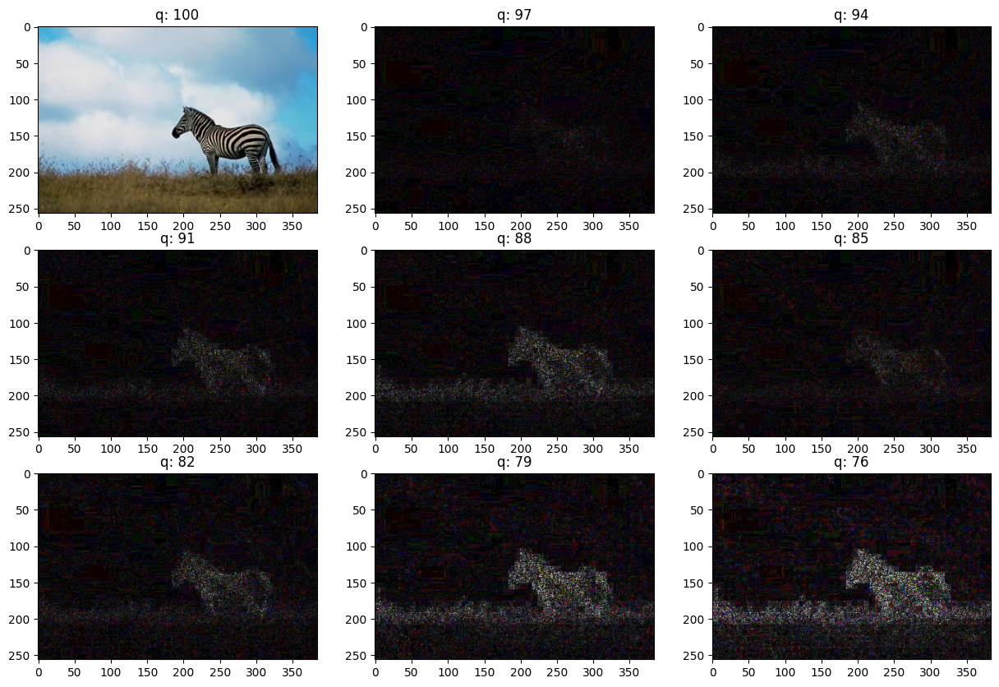

In [ ]:
import cv2
from os.path import join, exists, isdir
from pathlib import Path
import random
p = join('/content/Au_ani_00001.jpg')
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 3
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

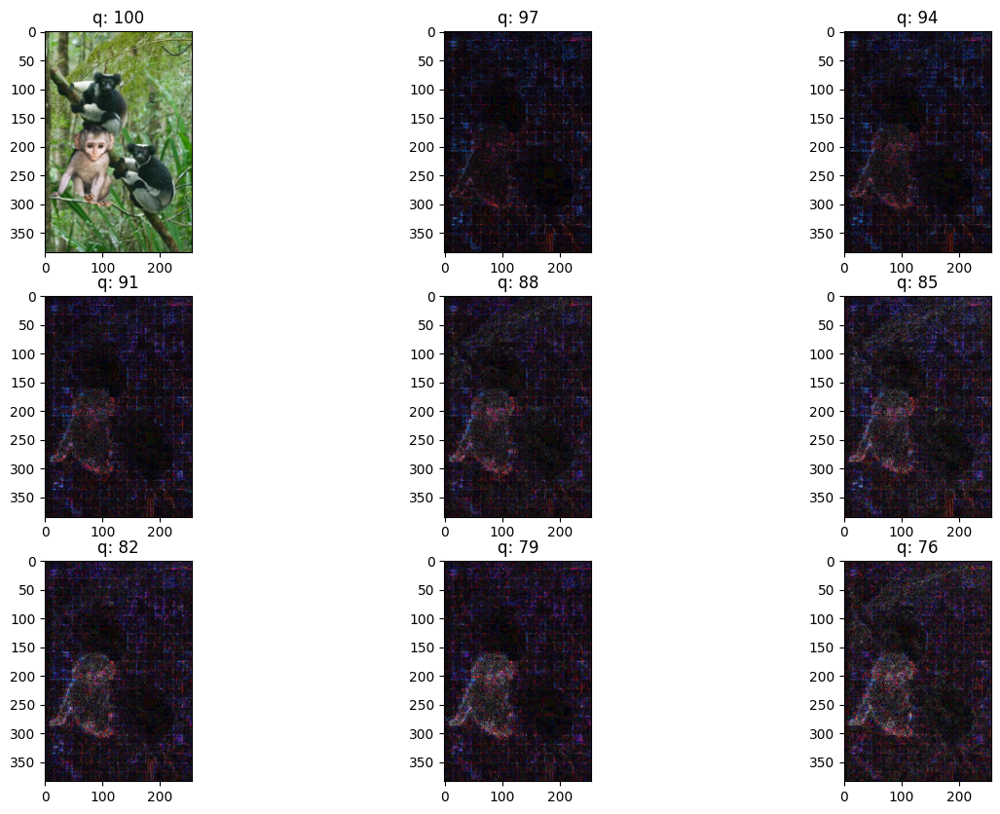

In [ ]:
p = join('/content/Tp_D_CND_S_N_ani00073_ani00068_00193.tif')
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 3
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

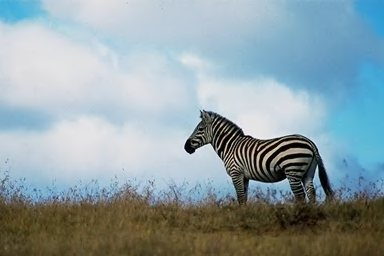

In [ ]:
real_image_path = '/content/Au_ani_00001.jpg'
Image.open(real_image_path)

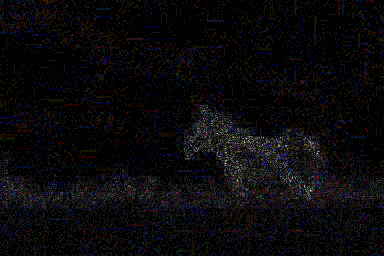

In [ ]:
convert_to_ela_image(real_image_path, 91)

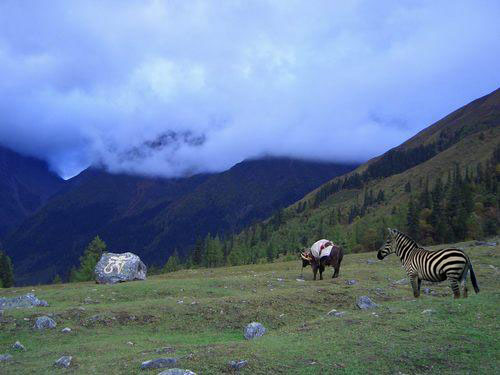

In [ ]:
fake_image_path = '/content/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg'
Image.open(fake_image_path)

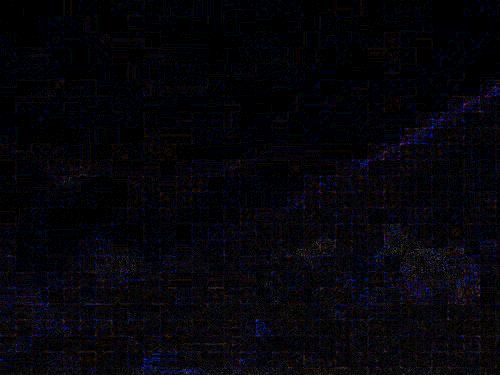

In [ ]:
convert_to_ela_image(fake_image_path, 91)

In [ ]:
# Color-image denoising
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise
# from sklearn.metrics import peak_signal_noise_ratio
import skimage.io

img_r1=skimage.io.imread('/content/Au_ani_00001.jpg')
img_r=skimage.img_as_float(img_r1) #converting image as float

sigma_est=estimate_sigma(img_r,channel_axis=True,average_sigmas=True)  #Noise estimation
# Denoising using Bayes
img_bayes=denoise_wavelet(img_r,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)

#Denoising using Visushrink
img_visushrink=denoise_wavelet(img_r,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
                               wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:348: UserWarning: image is size 3 on the last axis, but channel_axis is None. If this is a color image, please set channel_axis=-1 for proper noise estimation.
  return func(*args, **kwargs)
<ipython-input-21-6bceac140d2c>:12: FutureWarning: `multichannel` is a deprecated argument name for `denoise_wavelet`. It will be removed in version 1.0. Please use `channel_axis` instead.
  img_bayes=denoise_wavelet(img_r,method='BayesShrink',mode='soft',wavelet_levels=3,
<ipython-input-21-6bceac140d2c>:16: FutureWarning: `multichannel` is a deprecated argument name for `denoise_wavelet`. It will be removed in version 1.0. Please use `channel_axis` instead.
  img_visushrink=denoise_wavelet(img_r,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
/usr/local/lib/python3.10/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(

In [ ]:
import cv2
psnr_noisy = cv2.PSNR(img_r,img_r)
psnr_noisy

361.20199909921956

In [ ]:
psnr_bayes = cv2.PSNR(img_r,img_bayes)
psnr_bayes

122.94205708554246

In [ ]:
psnr_visu = cv2.PSNR(img_r,img_visushrink)
psnr_visu

105.60309429808467

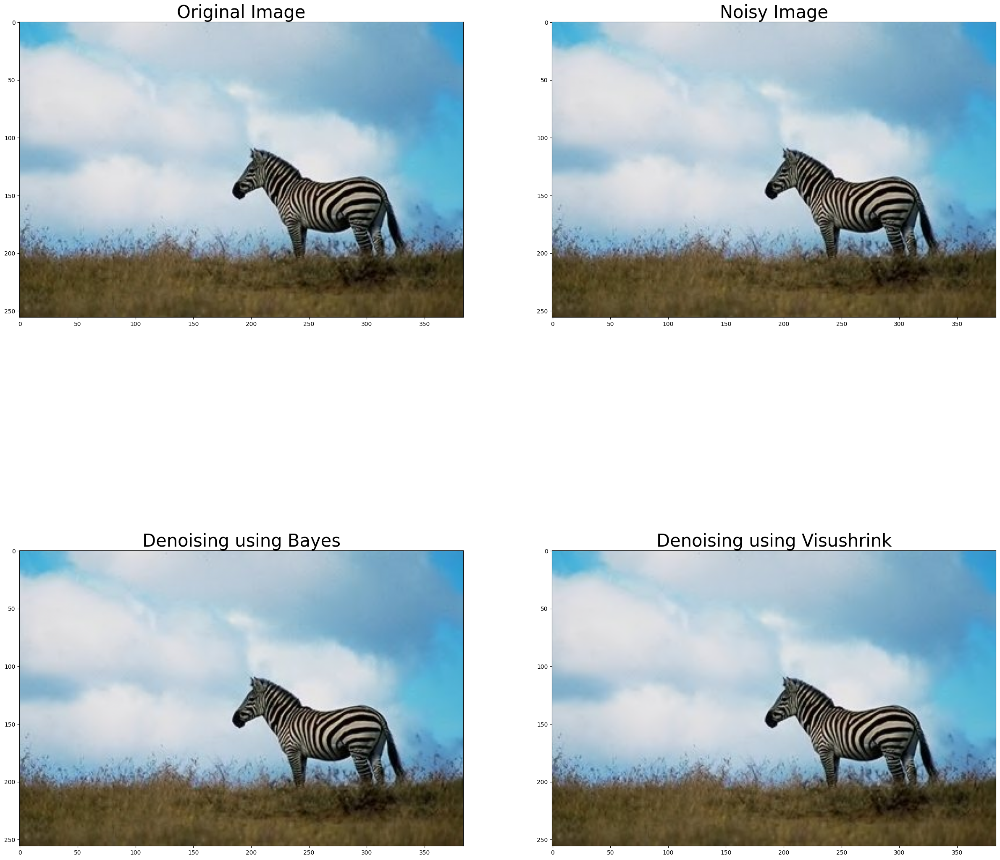

In [ ]:
# Plotting images
plt.figure(figsize=(30,30))

plt.subplot(2,2,1)
plt.imshow(img_r1,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,2)
plt.imshow(img_r,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes,cmap=plt.cm.gray)
plt.title('Denoising using Bayes',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink,cmap=plt.cm.gray)
plt.title('Denoising using Visushrink',fontsize=30)

plt.show()

In [ ]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 105.60309429808467
PSNR[Original vs. Denoised(Bayes)] 122.94205708554246


In [ ]:
# Color-image denoising
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise
# from sklearn.metrics import peak_signal_noise_ratiojpg
import skimage.io

img_f=skimage.io.imread('/content/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg')
img_f=skimage.img_as_float(img_f) #converting image as float

sigma=0.35 #noise
imgn=random_noise(img_f,var=sigma**2) # adding noise

sigma_est=estimate_sigma(img_f,channel_axis=True,average_sigmas=True)  #Noise estimation

# Denoising using Bayes
img_bayes=denoise_wavelet(img_f,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)


#Denoising using Visushrink
img_visushrink=denoise_wavelet(img_f,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
                               wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)

<ipython-input-28-12f080fabb20>:16: FutureWarning: `multichannel` is a deprecated argument name for `denoise_wavelet`. It will be removed in version 1.0. Please use `channel_axis` instead.
  img_bayes=denoise_wavelet(img_f,method='BayesShrink',mode='soft',wavelet_levels=3,
<ipython-input-28-12f080fabb20>:21: FutureWarning: `multichannel` is a deprecated argument name for `denoise_wavelet`. It will be removed in version 1.0. Please use `channel_axis` instead.
  img_visushrink=denoise_wavelet(img_f,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,


In [ ]:
import cv2
psnr_noisy = cv2.PSNR(img_f,img_f)
psnr_noisy

361.20199909921956

In [ ]:
psnr_bayes = cv2.PSNR(img_f,img_bayes)
psnr_bayes

120.58626094108678

In [ ]:
psnr_visu = cv2.PSNR(img_f,img_visushrink)
psnr_visu

102.95763087733451

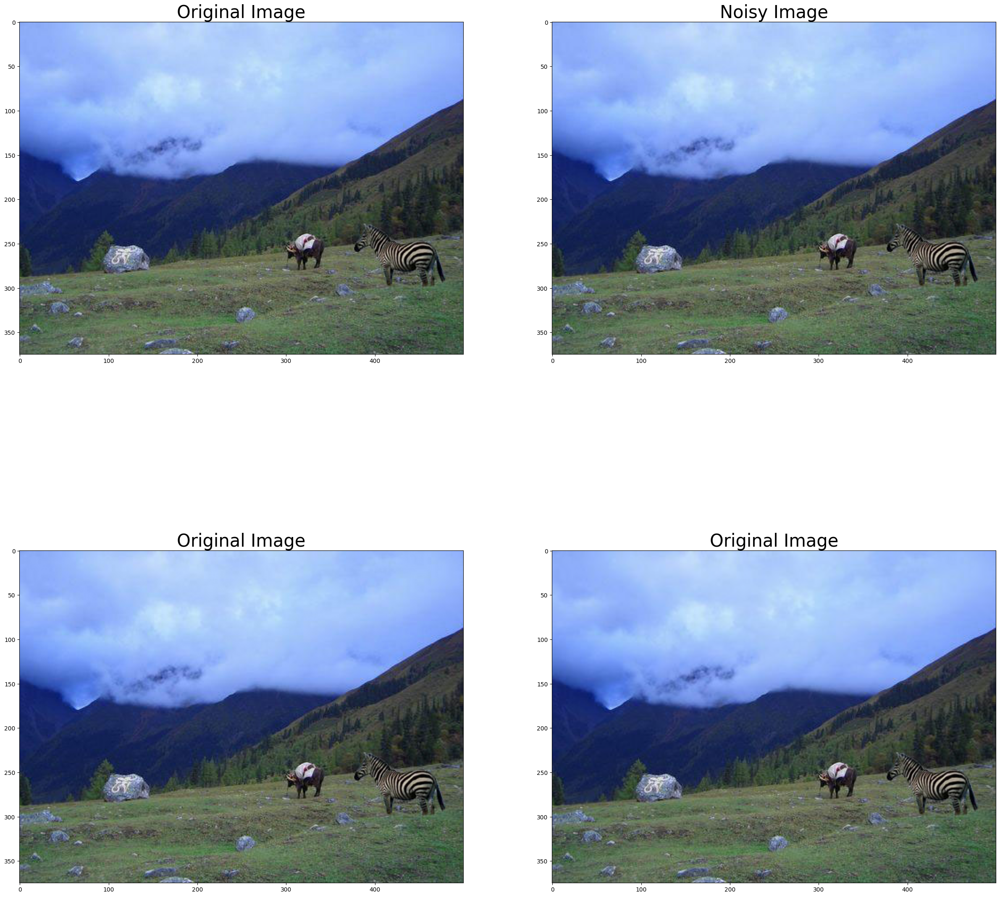

In [ ]:
# Plotting images
plt.figure(figsize=(30,30))

plt.subplot(2,2,1)
plt.imshow(img_f,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,2)
plt.imshow(img_f,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.show()

In [ ]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 102.95763087733451
PSNR[Original vs. Denoised(Bayes)] 120.58626094108678


In [ ]:
# Color-image denoising
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise
# from sklearn.metrics import peak_signal_noise_ratio
import skimage.io

In [ ]:
def denoise_img(img):
    #img=skimage.io.imread('/content/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg')
    img=skimage.img_as_float(img_f) #converting image as float


    sigma_est=estimate_sigma(img,multichannel=True,average_sigmas=True)  #Noise estimation

    # Denoising using Bayes
    img_bayes=denoise_wavelet(img,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)


    #Denoising using Visushrink
    img_visushrink=denoise_wavelet(img,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
    wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)
    return img_bayes

In [ ]:
image_size = (128, 128)

In [ ]:
def prepare_image(image_path):
    return np.array(convert_to_ela_image(image_path, 91).resize(image_size)).flatten() / 255.0

In [ ]:
X = [] # ELA converted images
Y = [] # 0 for fake, 1 for real

In [ ]:
import random
path = '/content/drive/MyDrive/Au1'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(1)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

random.shuffle(X)
X = X[:2100]
Y = Y[:2100]
print(len(X), len(Y))

Processing 500 images
506 506


In [42]:
path = '/content/drive/MyDrive/Tp1'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(0)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

print(len(X), len(Y))

816 816


In [43]:
import numpy as np
X = np.array(X)
Y = to_categorical(Y, 2)
X = X.reshape(-1, 128, 128, 3)

In [44]:
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size = 0.2, random_state=5)
X = X.reshape(-1,1,1,1)
print(len(X_train), len(Y_train))
print(len(X_val), len(Y_val))

652 652
164 164


In [45]:
def build_model():
    model = Sequential()
    model.add(Conv2D(filters = 32, kernel_size = (5, 5), padding = 'valid', activation = 'relu', input_shape = (128, 128, 3)))
    model.add(Conv2D(filters = 32, kernel_size = (5, 5), padding = 'valid', activation = 'relu', input_shape = (128, 128, 3)))
    model.add(MaxPool2D(pool_size = (2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(256, activation = 'relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2, activation = 'softmax'))
    return model

In [46]:
model = build_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 124, 124, 32)      2432      
                                                                 
 conv2d_1 (Conv2D)           (None, 120, 120, 32)      25632     
                                                                 
 max_pooling2d (MaxPooling2  (None, 60, 60, 32)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 60, 60, 32)        0         
                                                                 
 flatten (Flatten)           (None, 115200)            0         
                                                                 
 dense (Dense)               (None, 256)               29491456  
                                                        

In [47]:
from keras import optimizers
model.compile(loss='categorical_crossentropy', optimizer='Nadam', metrics=['accuracy'])

In [48]:
epochs = 24
batch_size = 32

In [50]:
from tensorflow.keras.optimizers import Adam

In [51]:
optimizer = Adam(lr = init_lr, beta_1 = init_lr/epochs)

In [52]:
optimizer = Adam(lr = init_lr, beta_1 = init_lr/epochs)

In [54]:
early_stopping = EarlyStopping(monitor = 'val_acc',
                              min_delta = 0,
                              patience = 2,
                              verbose = 0,
                              mode = 'auto')

In [55]:
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
x_train2 = np.array(X_train, copy=True)
y_train2 = np.array(Y_train, copy=True)

datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=10,
    fill_mode='nearest',
    validation_split = 0.2
    )


# compute quantities required for featurewise normalization
# (std, mean, and principal components if ZCA whitening is applied)

datagen.fit(X_train)

print(type(X_train))

#earlystopping = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=30, verbose=0, mode='min')

validation_generator = datagen.flow(x_train2, y_train2, batch_size=32, subset='validation')
train_generator = datagen.flow(x_train2, y_train2,batch_size=32, subset='training')


# # fits the model on batches with real-time data augmentation:
history = model.fit_generator(train_generator, epochs=epochs, validation_data = (X_val,Y_val), verbose = 1,callbacks = [early_stopping])

<class 'numpy.ndarray'>


<ipython-input-55-4e522436b413>:29: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator, epochs=epochs, validation_data = (X_val,Y_val), verbose = 1,callbacks = [early_stopping])


Epoch 1/24
17/17 [==============================] - ETA: 0s - loss: 3.1111 - accuracy: 0.6169

17/17 [==============================] - 84s 5s/step - loss: 3.1111 - accuracy: 0.6169 - val_loss: 0.6695 - val_accuracy: 0.6585
Epoch 2/24
17/17 [==============================] - ETA: 0s - loss: 0.5303 - accuracy: 0.7088

17/17 [==============================] - 71s 4s/step - loss: 0.5303 - accuracy: 0.7088 - val_loss: 0.6511 - val_accuracy: 0.7073
Epoch 3/24
17/17 [==============================] - ETA: 0s - loss: 0.4729 - accuracy: 0.8103

17/17 [==============================] - 64s 4s/step - loss: 0.4729 - accuracy: 0.8103 - val_loss: 0.6933 - val_accuracy: 0.4085
Epoch 4/24
17/17 [==============================] - ETA: 0s - loss: 0.4362 - accuracy: 0.8123

17/17 [==============================] - 69s 4s/step - loss: 0.4362 - accuracy: 0.8123 - val_loss: 0.6754 - val_accuracy: 0.6220
Epoch 5/24
17/17 [==============================] - ETA: 0s - loss: 0.4025 - accuracy: 0.8314

17/17 [==============================] - 64s 4s/step - loss: 0.4025 - accuracy: 0.8314 - val_loss: 0.7087 - val_accuracy: 0.3415
Epoch 6/24
17/17 [==============================] - ETA: 0s - loss: 0.4062 - accuracy: 0.8218

17/17 [==============================] - 81s 5s/step - loss: 0.4062 - accuracy: 0.8218 - val_loss: 0.6977 - val_accuracy: 0.4085
Epoch 7/24
17/17 [==============================] - ETA: 0s - loss: 0.3644 - accuracy: 0.8582

17/17 [==============================] - 85s 5s/step - loss: 0.3644 - accuracy: 0.8582 - val_loss: 0.7061 - val_accuracy: 0.3537
Epoch 8/24
17/17 [==============================] - ETA: 0s - loss: 0.3098 - accuracy: 0.8640

17/17 [==============================] - 65s 4s/step - loss: 0.3098 - accuracy: 0.8640 - val_loss: 0.7037 - val_accuracy: 0.3598
Epoch 9/24
17/17 [==============================] - ETA: 0s - loss: 0.3166 - accuracy: 0.8774

17/17 [==============================] - 67s 4s/step - loss: 0.3166 - accuracy: 0.8774 - val_loss: 0.7154 - val_accuracy: 0.3415
Epoch 10/24
17/17 [==============================] - ETA: 0s - loss: 0.2764 - accuracy: 0.8870

17/17 [==============================] - 64s 4s/step - loss: 0.2764 - accuracy: 0.8870 - val_loss: 0.7286 - val_accuracy: 0.3415
Epoch 11/24
17/17 [==============================] - ETA: 0s - loss: 0.2555 - accuracy: 0.8946

17/17 [==============================] - 65s 4s/step - loss: 0.2555 - accuracy: 0.8946 - val_loss: 0.7092 - val_accuracy: 0.3415
Epoch 12/24
17/17 [==============================] - ETA: 0s - loss: 0.2722 - accuracy: 0.8985

17/17 [==============================] - 62s 4s/step - loss: 0.2722 - accuracy: 0.8985 - val_loss: 0.7141 - val_accuracy: 0.3415
Epoch 13/24
17/17 [==============================] - ETA: 0s - loss: 0.2247 - accuracy: 0.9004

17/17 [==============================] - 66s 4s/step - loss: 0.2247 - accuracy: 0.9004 - val_loss: 0.7266 - val_accuracy: 0.3415
Epoch 14/24
17/17 [==============================] - ETA: 0s - loss: 0.1744 - accuracy: 0.9195

17/17 [==============================] - 64s 4s/step - loss: 0.1744 - accuracy: 0.9195 - val_loss: 0.7124 - val_accuracy: 0.3720
Epoch 15/24
17/17 [==============================] - ETA: 0s - loss: 0.1980 - accuracy: 0.9195

17/17 [==============================] - 66s 4s/step - loss: 0.1980 - accuracy: 0.9195 - val_loss: 0.7316 - val_accuracy: 0.3415
Epoch 16/24
17/17 [==============================] - ETA: 0s - loss: 0.1747 - accuracy: 0.9234

17/17 [==============================] - 64s 4s/step - loss: 0.1747 - accuracy: 0.9234 - val_loss: 0.7255 - val_accuracy: 0.3415
Epoch 17/24
17/17 [==============================] - ETA: 0s - loss: 0.1440 - accuracy: 0.9406

17/17 [==============================] - 70s 4s/step - loss: 0.1440 - accuracy: 0.9406 - val_loss: 0.7119 - val_accuracy: 0.3415
Epoch 18/24
17/17 [==============================] - ETA: 0s - loss: 0.1598 - accuracy: 0.9310

17/17 [==============================] - 65s 4s/step - loss: 0.1598 - accuracy: 0.9310 - val_loss: 0.7338 - val_accuracy: 0.3415
Epoch 19/24
17/17 [==============================] - ETA: 0s - loss: 0.1352 - accuracy: 0.9464

17/17 [==============================] - 63s 4s/step - loss: 0.1352 - accuracy: 0.9464 - val_loss: 0.7177 - val_accuracy: 0.3415
Epoch 20/24
17/17 [==============================] - ETA: 0s - loss: 0.1054 - accuracy: 0.9617

17/17 [==============================] - 71s 4s/step - loss: 0.1054 - accuracy: 0.9617 - val_loss: 0.7642 - val_accuracy: 0.3415
Epoch 21/24
17/17 [==============================] - ETA: 0s - loss: 0.1377 - accuracy: 0.9464

17/17 [==============================] - 63s 4s/step - loss: 0.1377 - accuracy: 0.9464 - val_loss: 0.8356 - val_accuracy: 0.3415
Epoch 22/24
17/17 [==============================] - ETA: 0s - loss: 0.1335 - accuracy: 0.9368

17/17 [==============================] - 64s 4s/step - loss: 0.1335 - accuracy: 0.9368 - val_loss: 0.7089 - val_accuracy: 0.3476
Epoch 23/24
17/17 [==============================] - ETA: 0s - loss: 0.1118 - accuracy: 0.9502

17/17 [==============================] - 69s 4s/step - loss: 0.1118 - accuracy: 0.9502 - val_loss: 0.8129 - val_accuracy: 0.3415
Epoch 24/24
17/17 [==============================] - ETA: 0s - loss: 0.1090 - accuracy: 0.9655

17/17 [==============================] - 64s 4s/step - loss: 0.1090 - accuracy: 0.9655 - val_loss: 0.7585 - val_accuracy: 0.3415


In [56]:
model.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ['accuracy'])

In [57]:
hist = model.fit(X_train,
                 Y_train,
                 batch_size = batch_size,
                 epochs = epochs,
                validation_data = (X_val, Y_val),
                callbacks = [early_stopping])

Epoch 1/24
21/21 [==============================] - ETA: 0s - loss: 0.5508 - accuracy: 0.7270

21/21 [==============================] - 78s 4s/step - loss: 0.5508 - accuracy: 0.7270 - val_loss: 0.4380 - val_accuracy: 0.8293
Epoch 2/24
21/21 [==============================] - ETA: 0s - loss: 0.4433 - accuracy: 0.8313

21/21 [==============================] - 73s 4s/step - loss: 0.4433 - accuracy: 0.8313 - val_loss: 0.3953 - val_accuracy: 0.8354
Epoch 3/24
21/21 [==============================] - ETA: 0s - loss: 0.4130 - accuracy: 0.8221

21/21 [==============================] - 74s 4s/step - loss: 0.4130 - accuracy: 0.8221 - val_loss: 0.5722 - val_accuracy: 0.7927
Epoch 4/24
21/21 [==============================] - ETA: 0s - loss: 0.3301 - accuracy: 0.8926

21/21 [==============================] - 74s 4s/step - loss: 0.3301 - accuracy: 0.8926 - val_loss: 3.8914 - val_accuracy: 0.3415
Epoch 5/24
21/21 [==============================] - ETA: 0s - loss: 0.5499 - accuracy: 0.8528

21/21 [==============================] - 76s 4s/step - loss: 0.5499 - accuracy: 0.8528 - val_loss: 0.3076 - val_accuracy: 0.8780
Epoch 6/24
21/21 [==============================] - ETA: 0s - loss: 0.2538 - accuracy: 0.9172

21/21 [==============================] - 72s 3s/step - loss: 0.2538 - accuracy: 0.9172 - val_loss: 0.2816 - val_accuracy: 0.8720
Epoch 7/24
21/21 [==============================] - ETA: 0s - loss: 0.1623 - accuracy: 0.9509

21/21 [==============================] - 74s 4s/step - loss: 0.1623 - accuracy: 0.9509 - val_loss: 0.3009 - val_accuracy: 0.9146
Epoch 8/24
21/21 [==============================] - ETA: 0s - loss: 0.1173 - accuracy: 0.9709

21/21 [==============================] - 72s 3s/step - loss: 0.1173 - accuracy: 0.9709 - val_loss: 0.3444 - val_accuracy: 0.9085
Epoch 9/24
21/21 [==============================] - ETA: 0s - loss: 0.1335 - accuracy: 0.9678

21/21 [==============================] - 85s 4s/step - loss: 0.1335 - accuracy: 0.9678 - val_loss: 0.2829 - val_accuracy: 0.8720
Epoch 10/24
21/21 [==============================] - ETA: 0s - loss: 0.0870 - accuracy: 0.9785

21/21 [==============================] - 74s 4s/step - loss: 0.0870 - accuracy: 0.9785 - val_loss: 0.3104 - val_accuracy: 0.8902
Epoch 11/24
21/21 [==============================] - ETA: 0s - loss: 0.1403 - accuracy: 0.9494

21/21 [==============================] - 74s 3s/step - loss: 0.1403 - accuracy: 0.9494 - val_loss: 0.2839 - val_accuracy: 0.8841
Epoch 12/24
21/21 [==============================] - ETA: 0s - loss: 0.0406 - accuracy: 0.9954

21/21 [==============================] - 74s 3s/step - loss: 0.0406 - accuracy: 0.9954 - val_loss: 0.3251 - val_accuracy: 0.9024
Epoch 13/24
21/21 [==============================] - ETA: 0s - loss: 0.0349 - accuracy: 0.9908

21/21 [==============================] - 74s 3s/step - loss: 0.0349 - accuracy: 0.9908 - val_loss: 0.4057 - val_accuracy: 0.9085
Epoch 14/24
21/21 [==============================] - ETA: 0s - loss: 0.0330 - accuracy: 0.9939

21/21 [==============================] - 75s 4s/step - loss: 0.0330 - accuracy: 0.9939 - val_loss: 0.3621 - val_accuracy: 0.8963
Epoch 15/24
21/21 [==============================] - ETA: 0s - loss: 0.0173 - accuracy: 0.9954

21/21 [==============================] - 73s 3s/step - loss: 0.0173 - accuracy: 0.9954 - val_loss: 0.4130 - val_accuracy: 0.8841
Epoch 16/24
21/21 [==============================] - ETA: 0s - loss: 0.4052 - accuracy: 0.9126

21/21 [==============================] - 74s 4s/step - loss: 0.4052 - accuracy: 0.9126 - val_loss: 0.4996 - val_accuracy: 0.6890
Epoch 17/24
21/21 [==============================] - ETA: 0s - loss: 0.4355 - accuracy: 0.8129

21/21 [==============================] - 77s 4s/step - loss: 0.4355 - accuracy: 0.8129 - val_loss: 0.2810 - val_accuracy: 0.8780
Epoch 18/24
21/21 [==============================] - ETA: 0s - loss: 0.1602 - accuracy: 0.9509

21/21 [==============================] - 79s 4s/step - loss: 0.1602 - accuracy: 0.9509 - val_loss: 0.2676 - val_accuracy: 0.8841
Epoch 19/24
21/21 [==============================] - ETA: 0s - loss: 0.0861 - accuracy: 0.9755

21/21 [==============================] - 73s 3s/step - loss: 0.0861 - accuracy: 0.9755 - val_loss: 0.2969 - val_accuracy: 0.8841
Epoch 20/24
21/21 [==============================] - ETA: 0s - loss: 0.0388 - accuracy: 0.9923

21/21 [==============================] - 73s 3s/step - loss: 0.0388 - accuracy: 0.9923 - val_loss: 0.4028 - val_accuracy: 0.9024
Epoch 21/24
21/21 [==============================] - ETA: 0s - loss: 0.0384 - accuracy: 0.9923

21/21 [==============================] - 79s 4s/step - loss: 0.0384 - accuracy: 0.9923 - val_loss: 0.4481 - val_accuracy: 0.9024
Epoch 22/24
21/21 [==============================] - ETA: 0s - loss: 0.0263 - accuracy: 0.9939

21/21 [==============================] - 74s 4s/step - loss: 0.0263 - accuracy: 0.9939 - val_loss: 0.4682 - val_accuracy: 0.9024
Epoch 23/24
21/21 [==============================] - ETA: 0s - loss: 0.0505 - accuracy: 0.9831

21/21 [==============================] - 76s 4s/step - loss: 0.0505 - accuracy: 0.9831 - val_loss: 0.2872 - val_accuracy: 0.8841
Epoch 24/24
21/21 [==============================] - ETA: 0s - loss: 0.0307 - accuracy: 0.9969

21/21 [==============================] - 72s 3s/step - loss: 0.0307 - accuracy: 0.9969 - val_loss: 0.4314 - val_accuracy: 0.8963


In [58]:
model.save('model_casia_run1.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


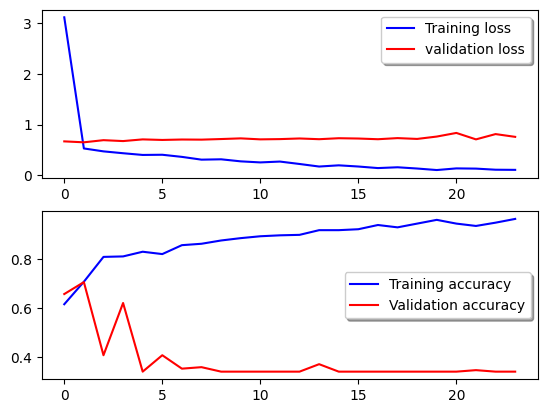

In [59]:
# Plot the loss and accuracy curves for training and validation
fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

In [60]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')


6/6 [==============================] - 6s 967ms/step


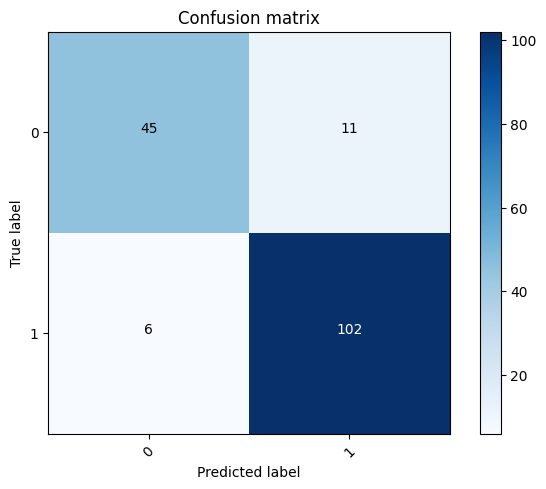

In [61]:
# Predict the values from the validation dataset
Y_pred = model.predict(X_val)
# Convert predictions classes to one hot vectors
Y_pred_classes = np.argmax(Y_pred,axis = 1)
# Convert validation observations to one hot vectors
Y_true = np.argmax(Y_val,axis = 1)
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(2))

In [62]:
class_names = ['fake', 'real']

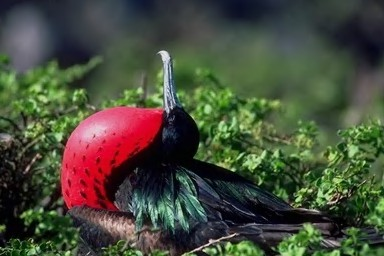

In [64]:
real_image_path = '/content/drive/MyDrive/Au1/Au_ani_00004.jpg'
Image.open(real_image_path)

In [65]:
image = prepare_image(real_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 [==============================] - 0s 89ms/step
Class: real Confidence: 100.00


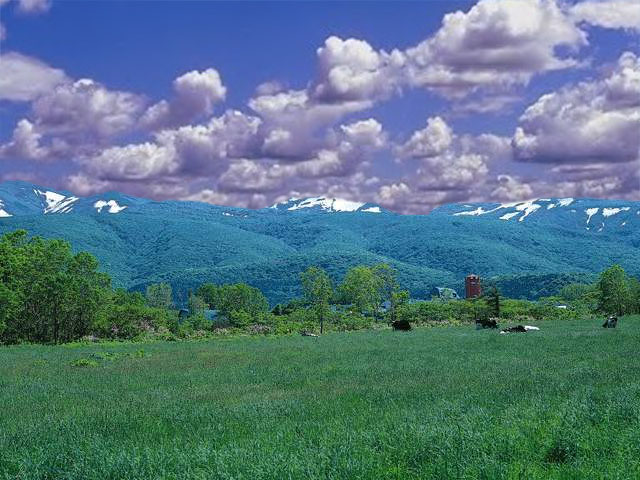

In [66]:
fake_image_path = '/content/drive/MyDrive/Tp1/Tp_D_CNN_M_B_nat10139_nat00059_11949.jpg'
Image.open(fake_image_path)

In [67]:
image = prepare_image(fake_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 [==============================] - 0s 83ms/step
Class: fake Confidence: 100.00
